## *Analysis*

In [1]:
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt

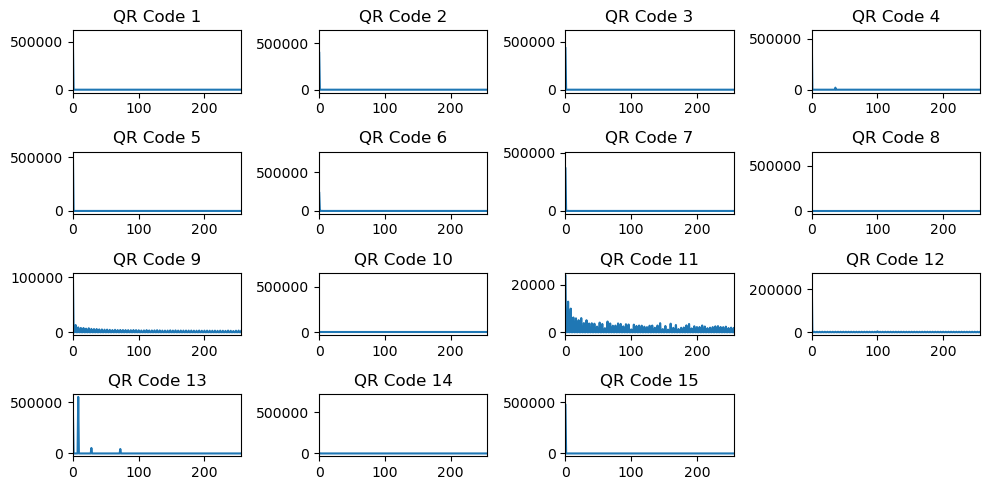

In [14]:
def histogram_analysis(image_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Calculate the histogram
    hist = cv2.calcHist([img], [0], None, [1024], [0, 256])
    
    return hist.flatten()


# Directory containing QR code images
qr_images_dir = "Test Cases"

# List to store histograms
histograms = []

# Iterate through each image in the directory
for filename in os.listdir(qr_images_dir):
    if filename.endswith(".png") :
        image_path = os.path.join(qr_images_dir, filename)
        hist = histogram_analysis(image_path)
        histograms.append(hist)

# Convert list of histograms to numpy array
histograms = np.array(histograms)

# Plotting histograms
plt.figure(figsize=(10, 5))
for i, hist in enumerate(histograms):
    plt.subplot(4, 4, i + 1)
    plt.plot(hist)
    plt.title(f"QR Code {i+1}")
    plt.xlim([0, 256])

plt.tight_layout()
plt.show()



c:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


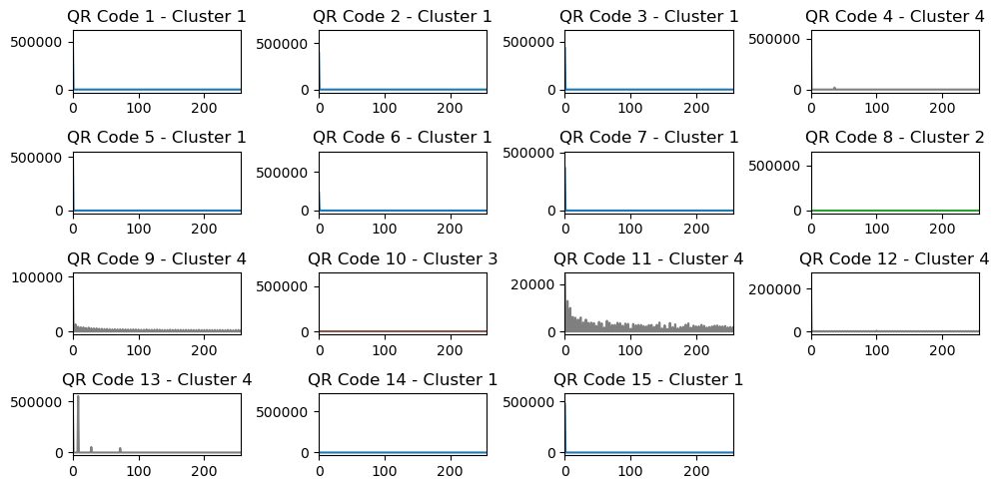

In [18]:
# Perform K-means clustering
from sklearn.cluster import KMeans

def cluster():
    # Perform K-means clustering
    num_clusters = 4  # Adjust the number of clusters as needed
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    clusters = kmeans.fit_predict(histograms)
    
    # Plotting histograms with clustered colors
    plt.figure(figsize=(10, 5))
    for i, (hist, cluster) in enumerate(zip(histograms, clusters)):
        plt.subplot(4, 4, i + 1)
        plt.plot(hist, color=plt.cm.tab10(cluster / num_clusters))  # Color based on cluster
        plt.title(f"QR Code {i+1} - Cluster {cluster+1}")
        plt.xlim([0, 256])
    
    plt.tight_layout()
    plt.show()

cluster()


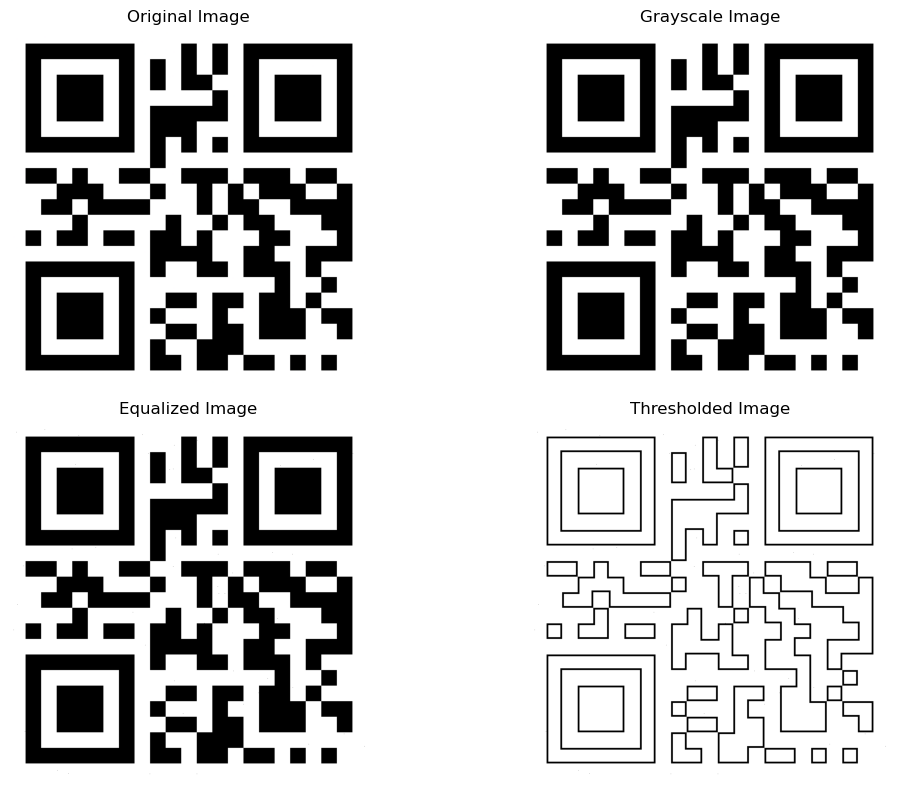

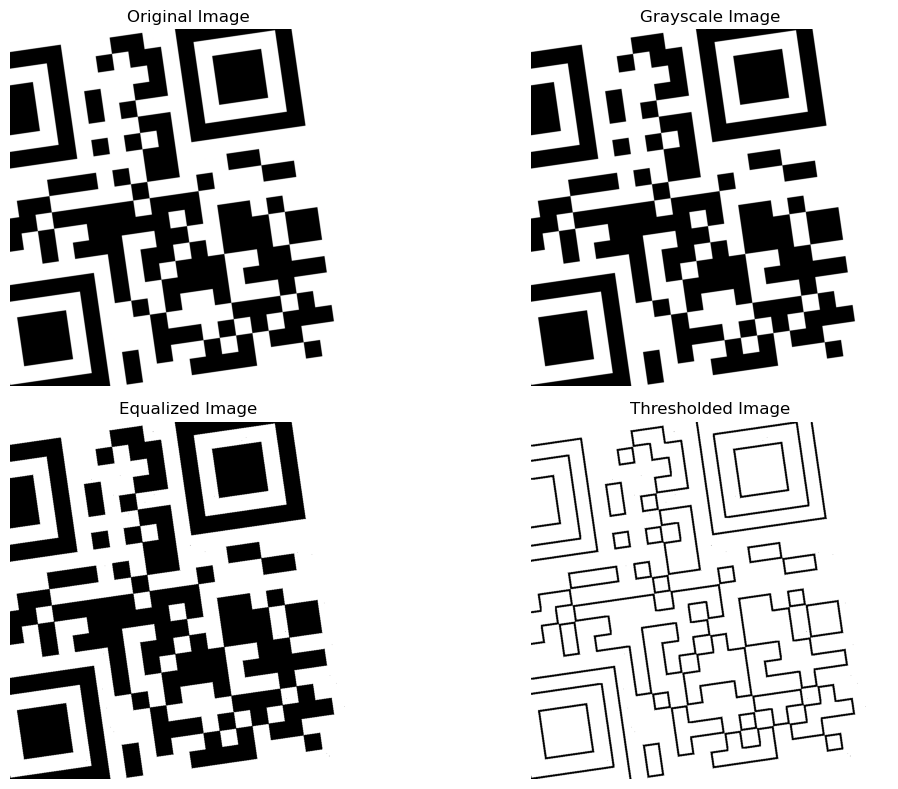

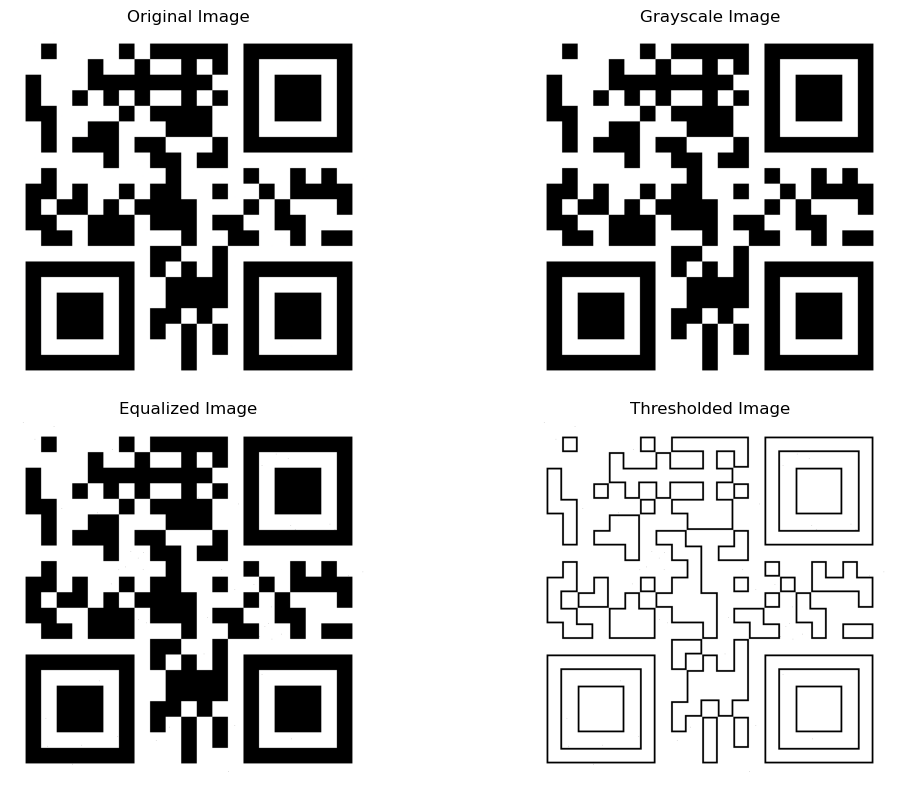

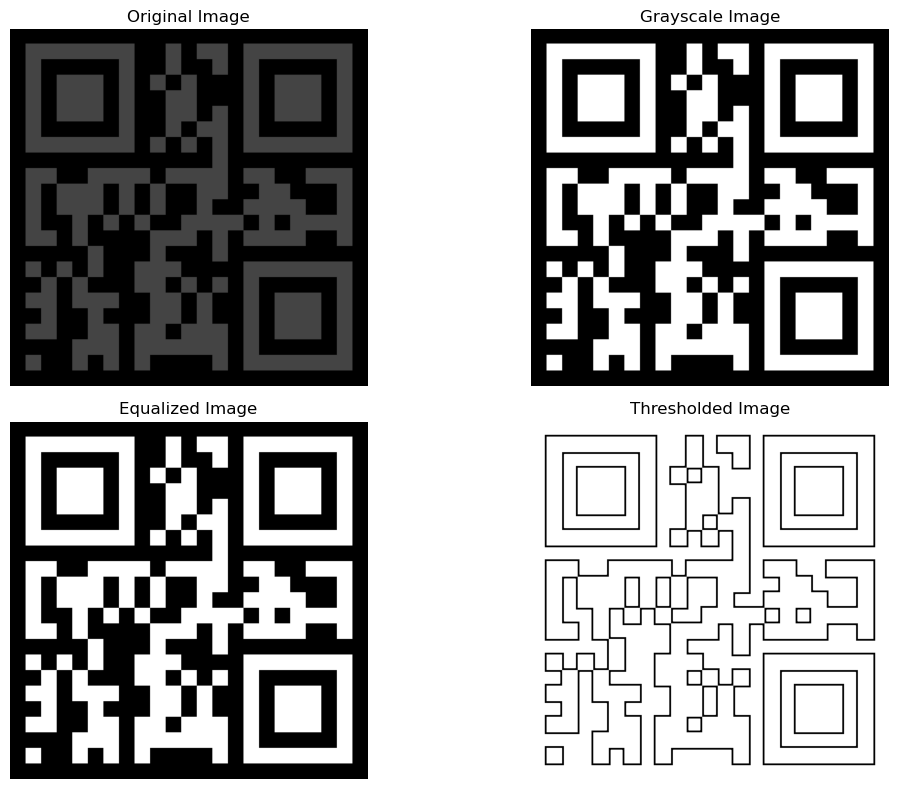

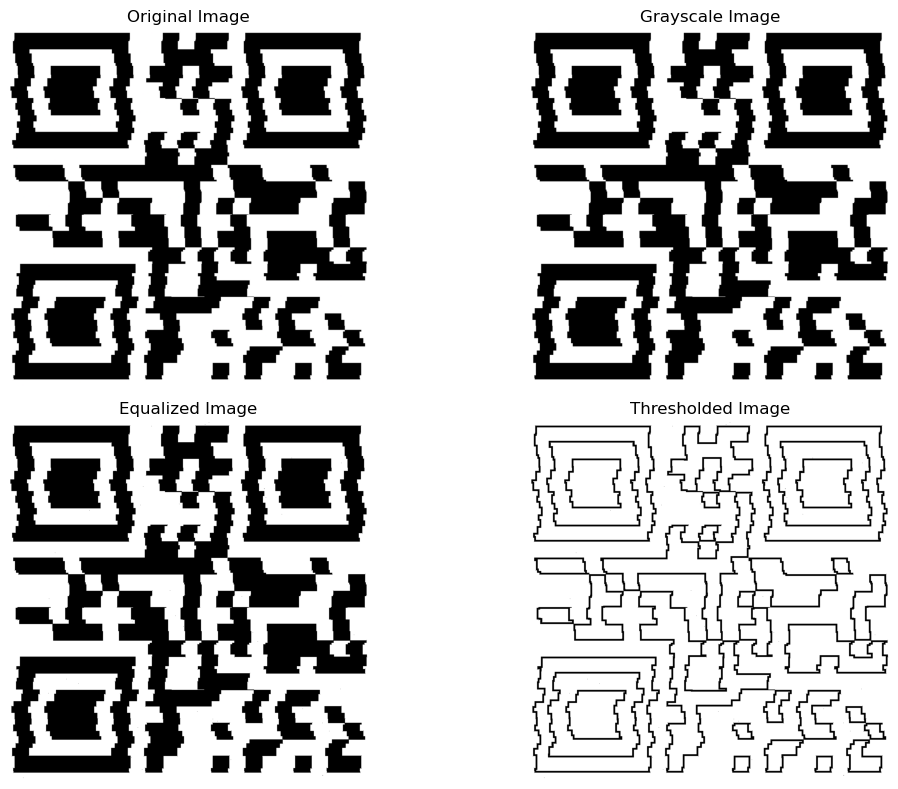

...

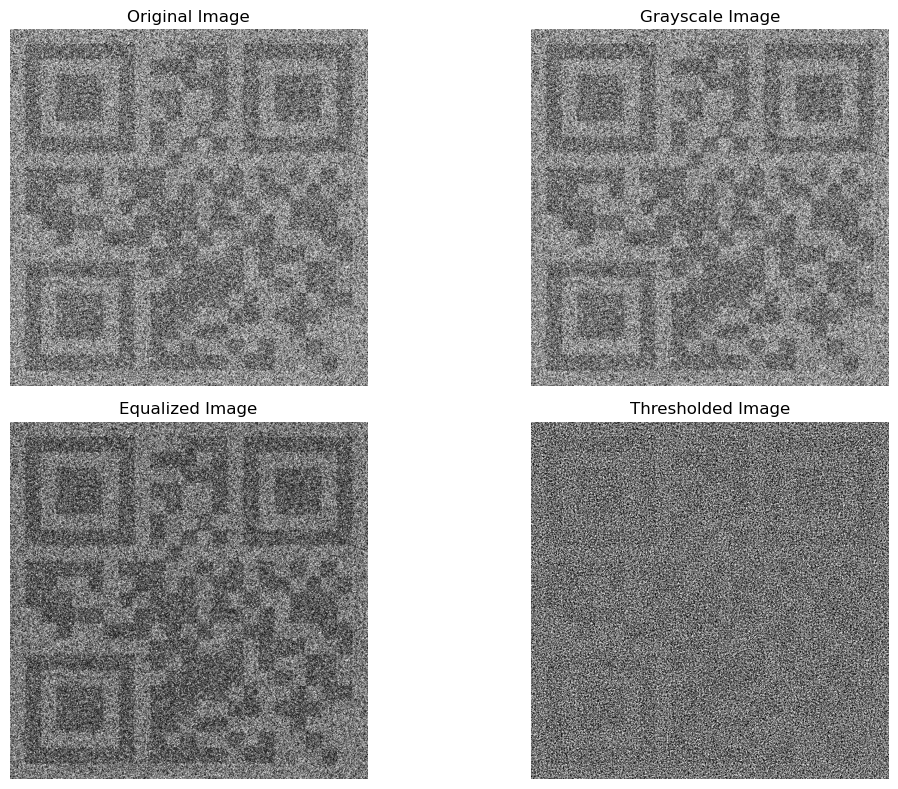

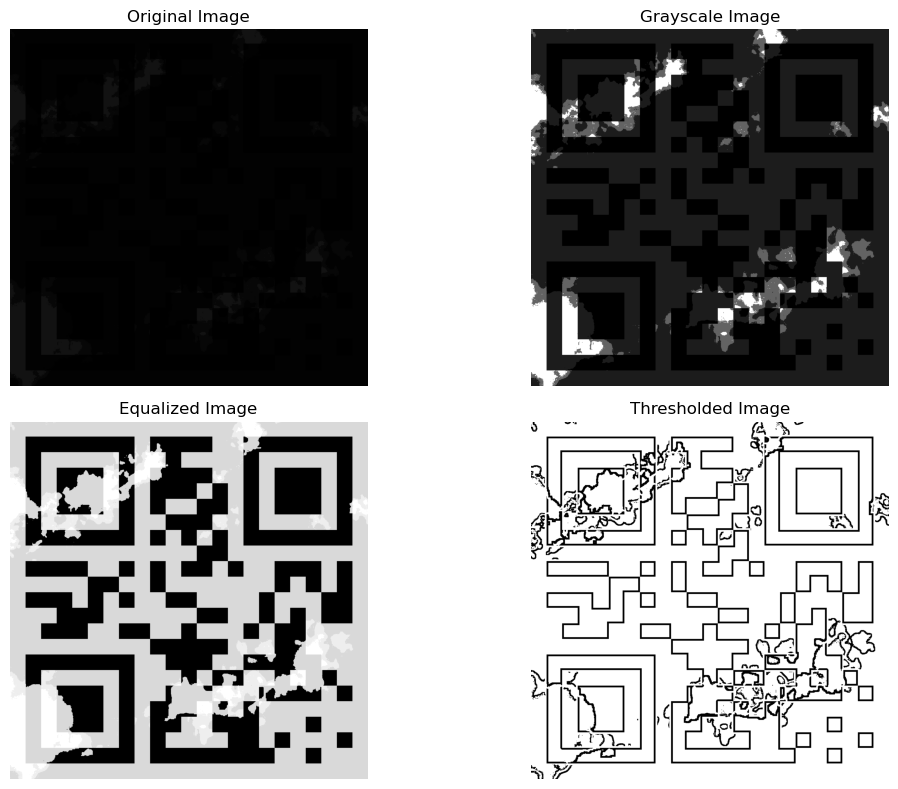

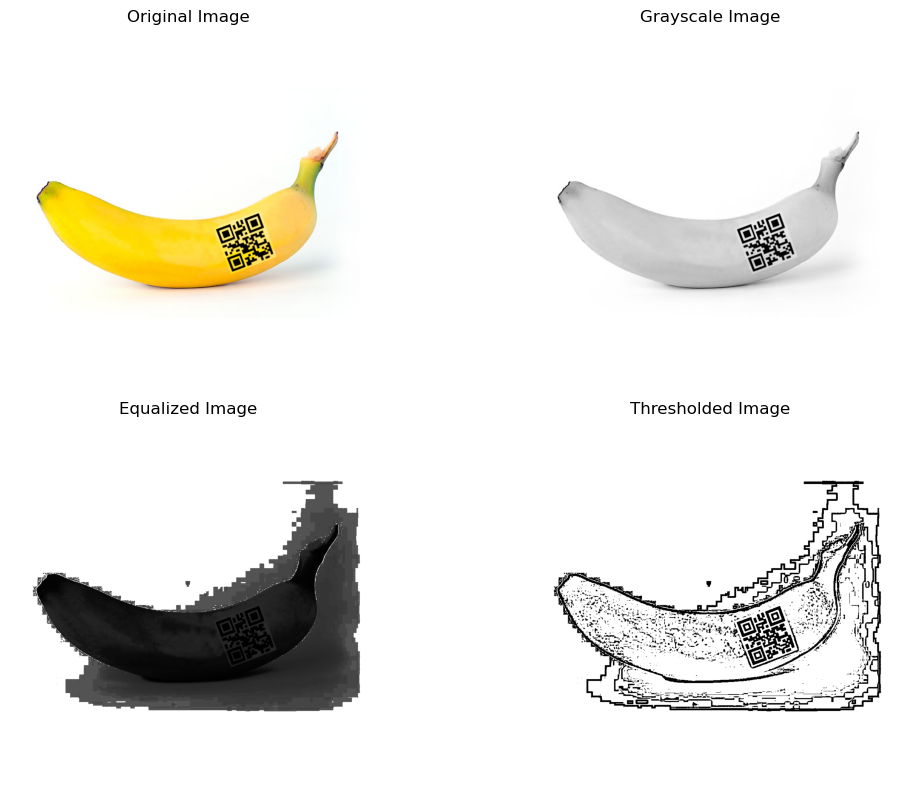

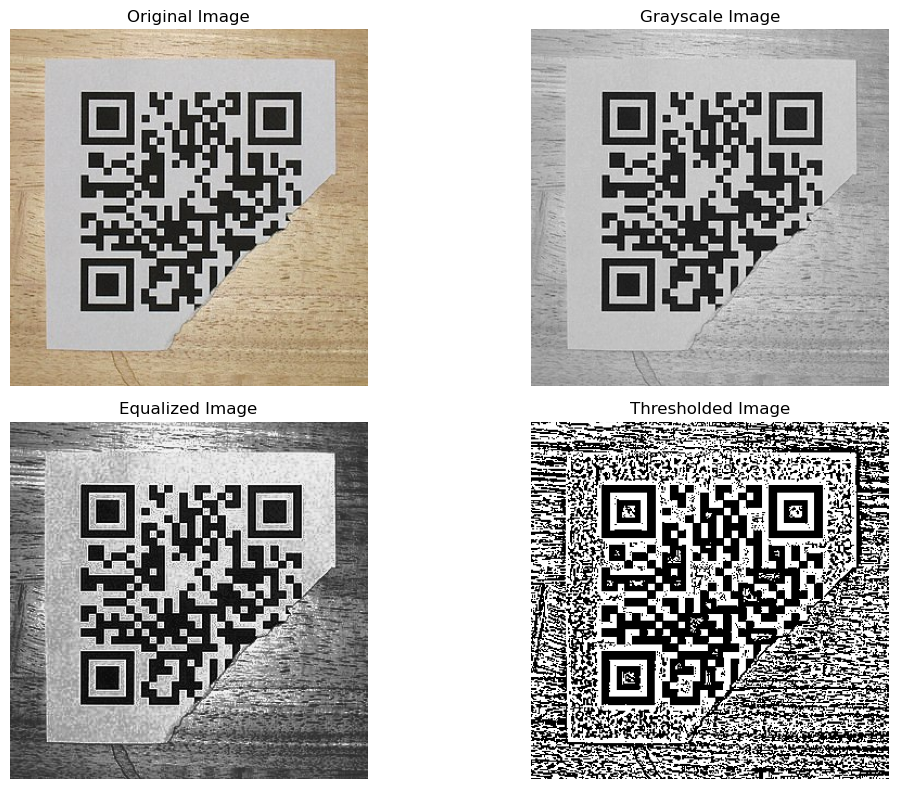

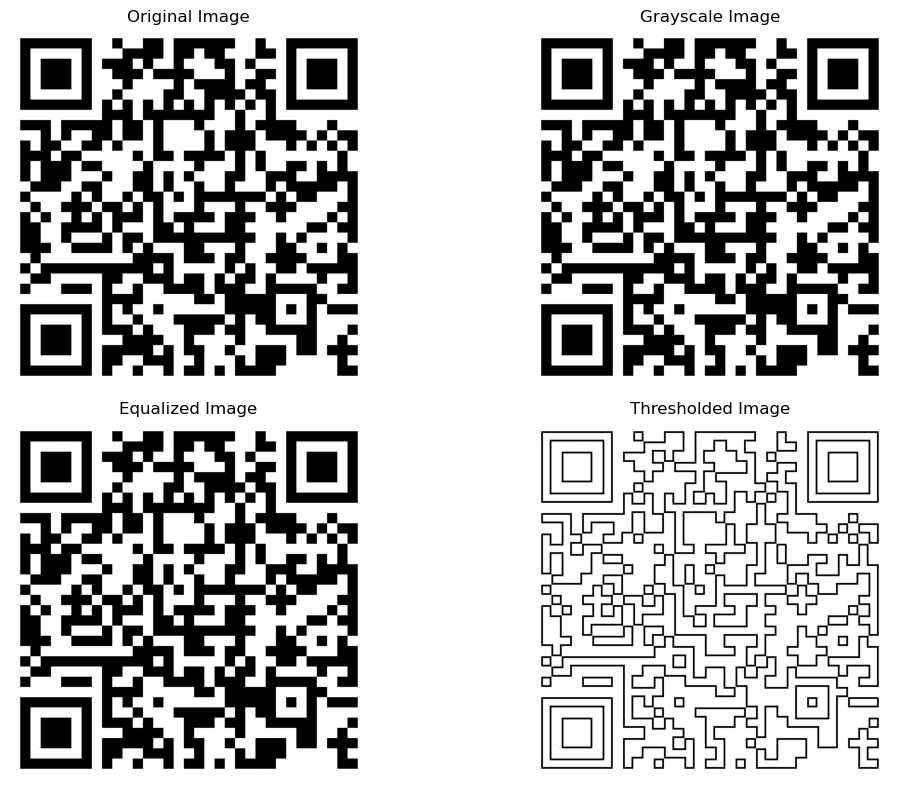

In [44]:
import cv2
import os
import matplotlib.pyplot as plt

# Directory containing QR code images
directory = "test cases"

# Function to load and preprocess images
def preprocess_images():
    for filename in os.listdir(directory):
        if filename.endswith(".png") or filename.endswith(".jpg"):
            # Load image
            img_path = os.path.join(directory, filename)
            img = cv2.imread(img_path)
            
            # Convert to grayscale
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
            # Histogram equalization
            eq_img = cv2.equalizeHist(gray_img)
            
            # Adaptive thresholding
            thresh_img = cv2.adaptiveThreshold(eq_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
            
            # Plot original, grayscale, equalized, and thresholded images
            plt.figure(figsize=(12, 8))
            
            # Original image plot
            plt.subplot(2, 2, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("Original Image")
            plt.axis('off')
            
            # Grayscale image plot
            plt.subplot(2, 2, 2)
            plt.imshow(gray_img, cmap='gray')
            plt.title("Grayscale Image")
            plt.axis('off')
            
            # Equalized image plot
            plt.subplot(2, 2, 3)
            plt.imshow(eq_img, cmap='gray')
            plt.title("Equalized Image")
            plt.axis('off')
            
            # Thresholded image plot
            plt.subplot(2, 2, 4)
            plt.imshow(thresh_img, cmap='gray')
            plt.title("Thresholded Image")
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()
            
            # Further processing steps (dilation, contour detection, etc.) can be added here

# Call the preprocessing function
preprocess_images()


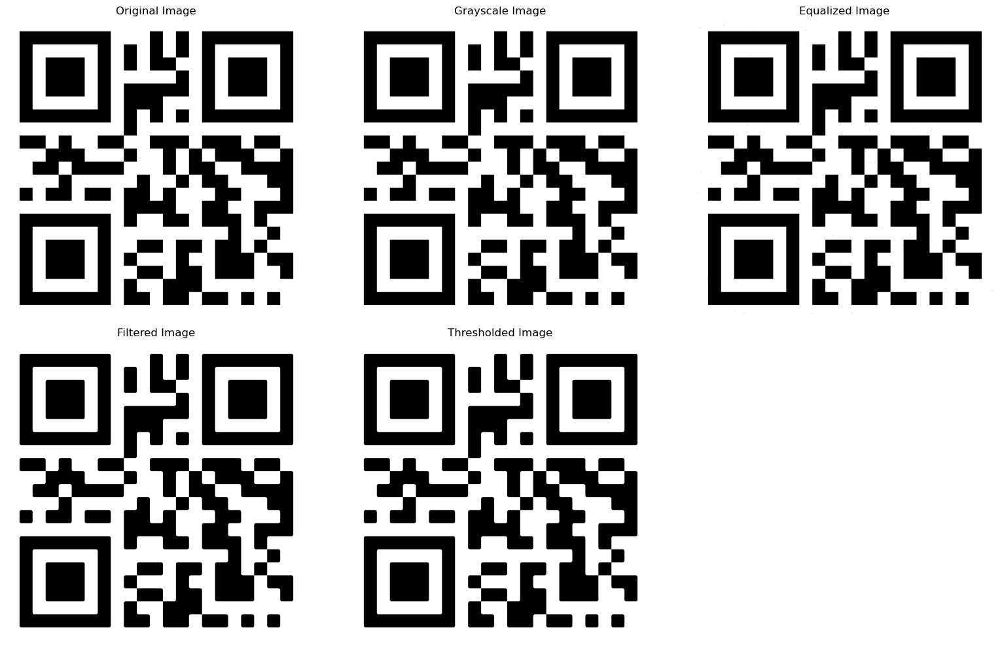

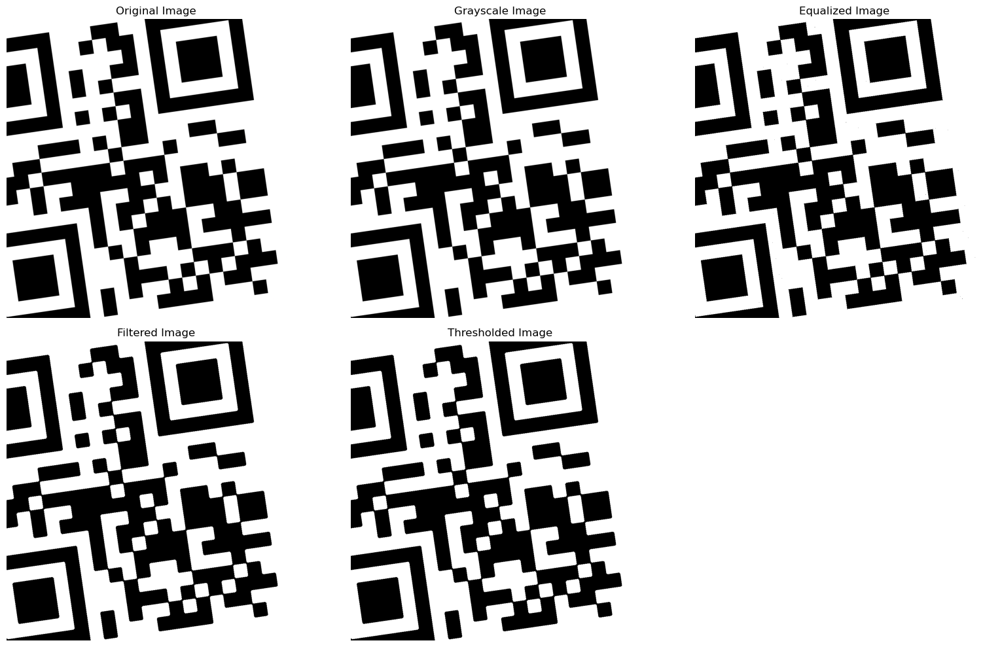

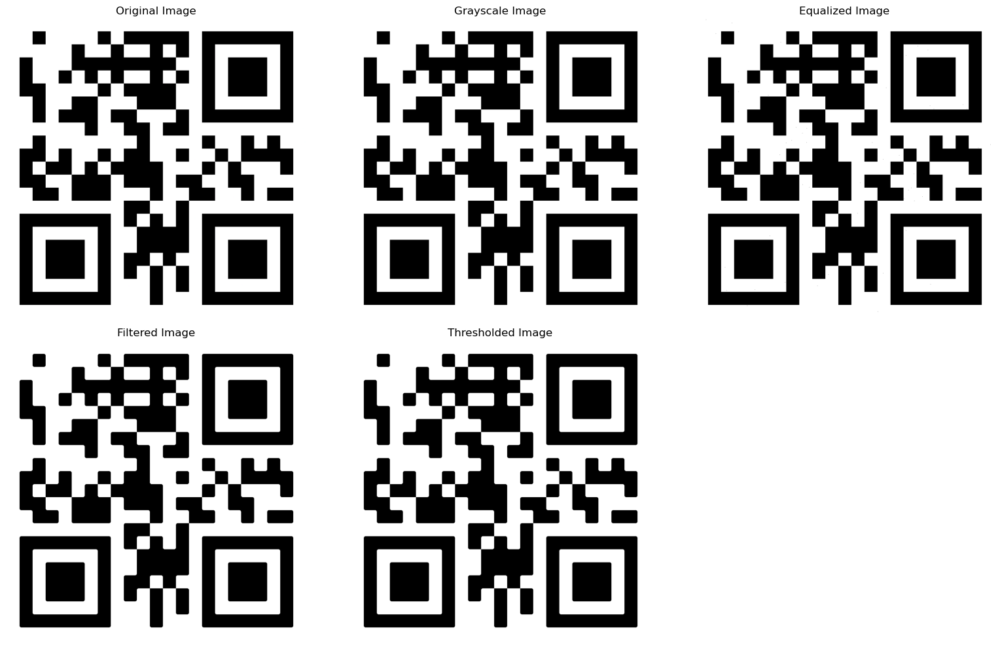

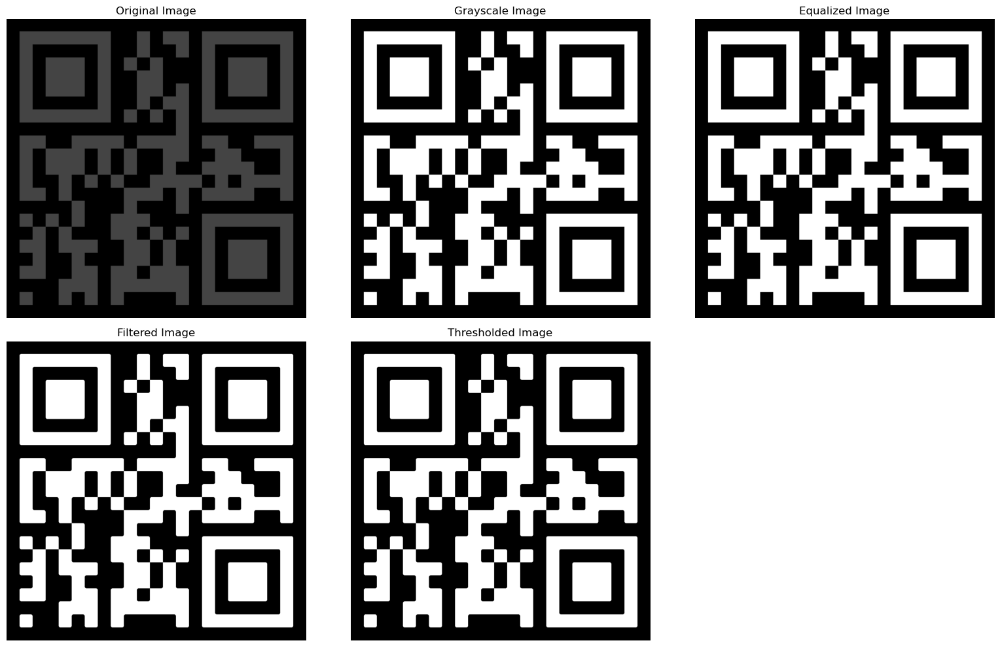

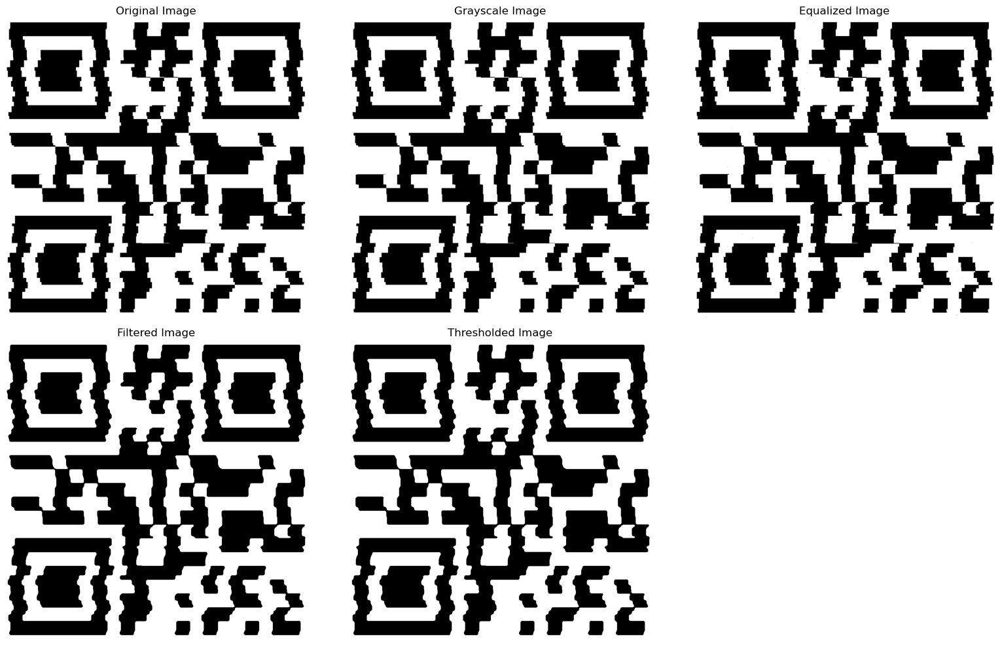

...

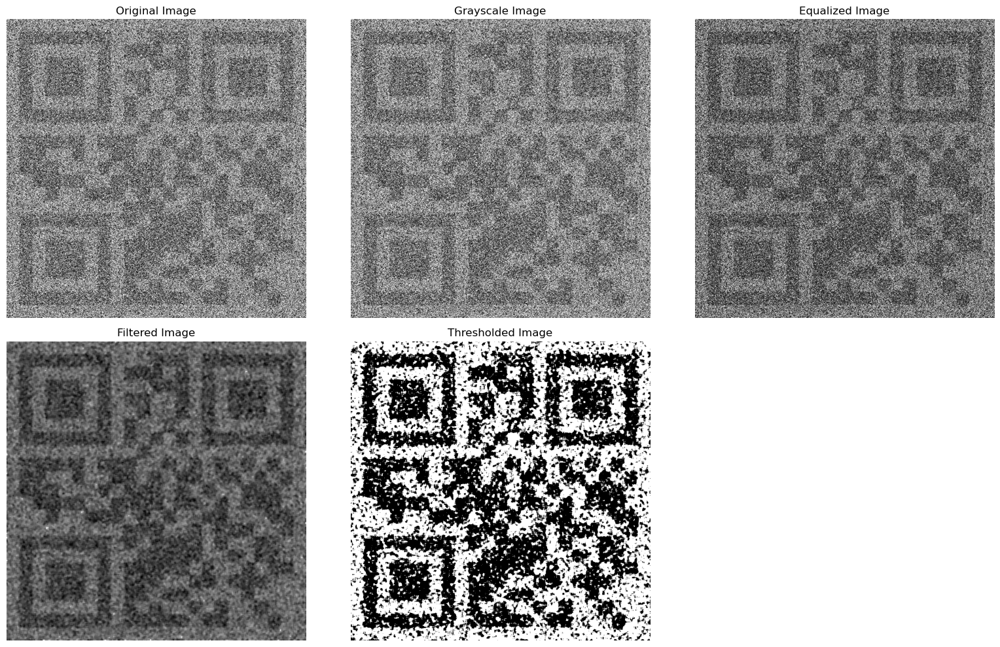

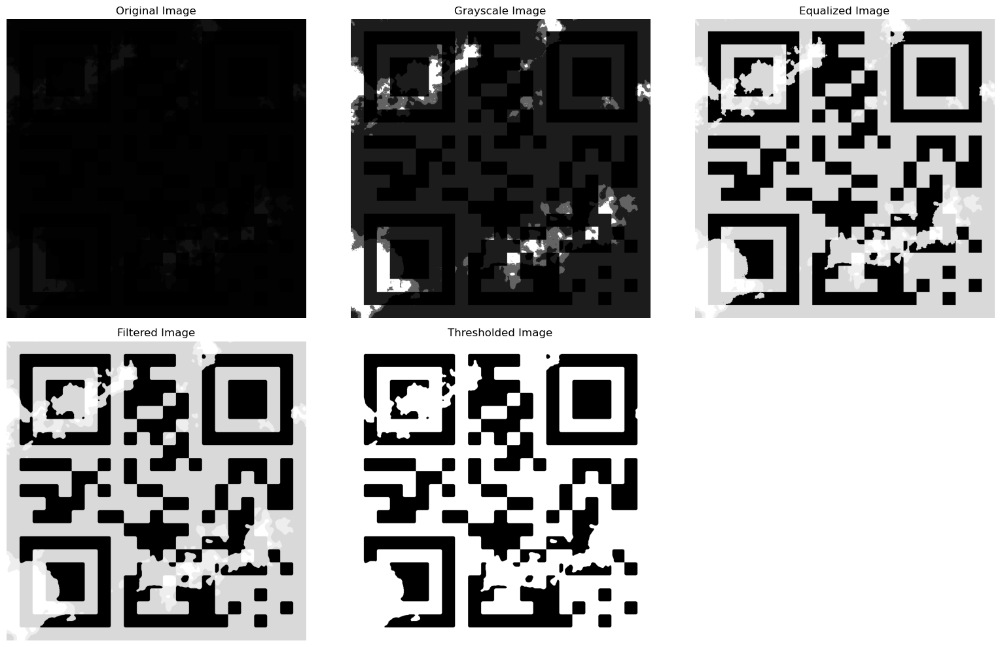

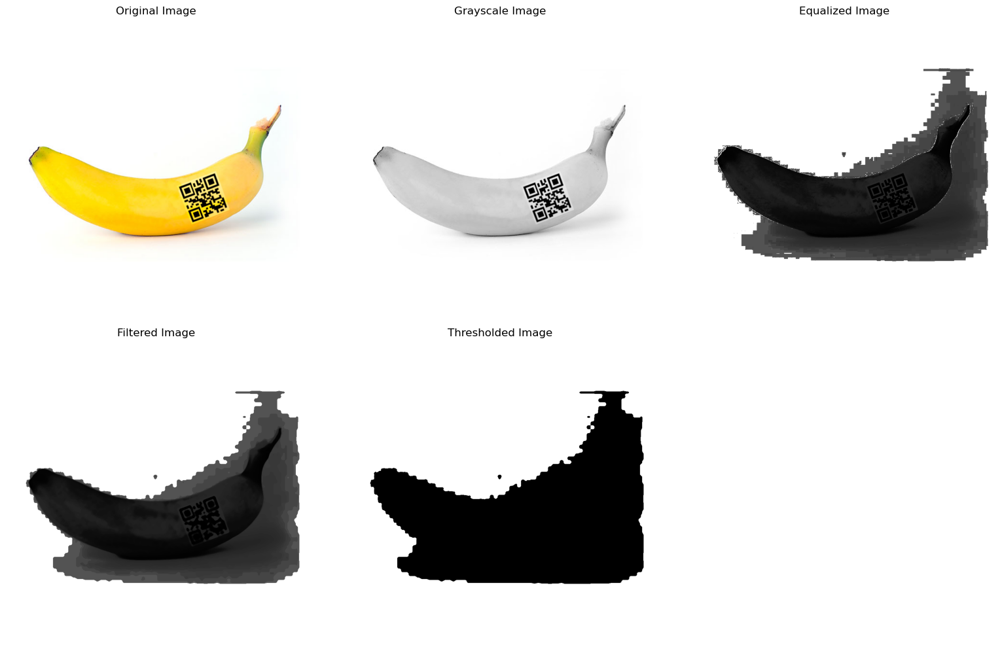

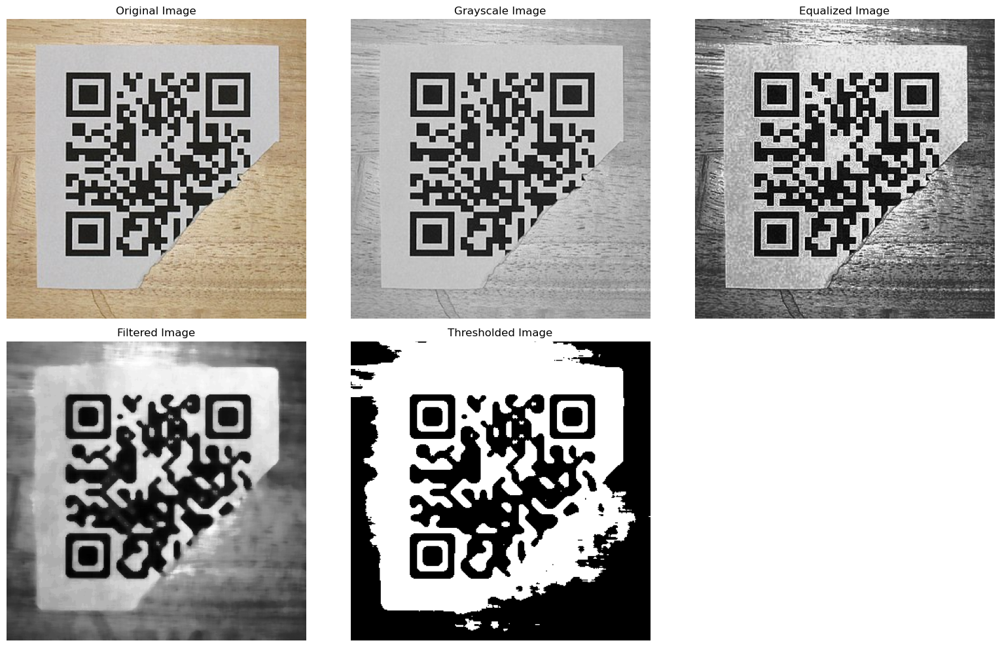

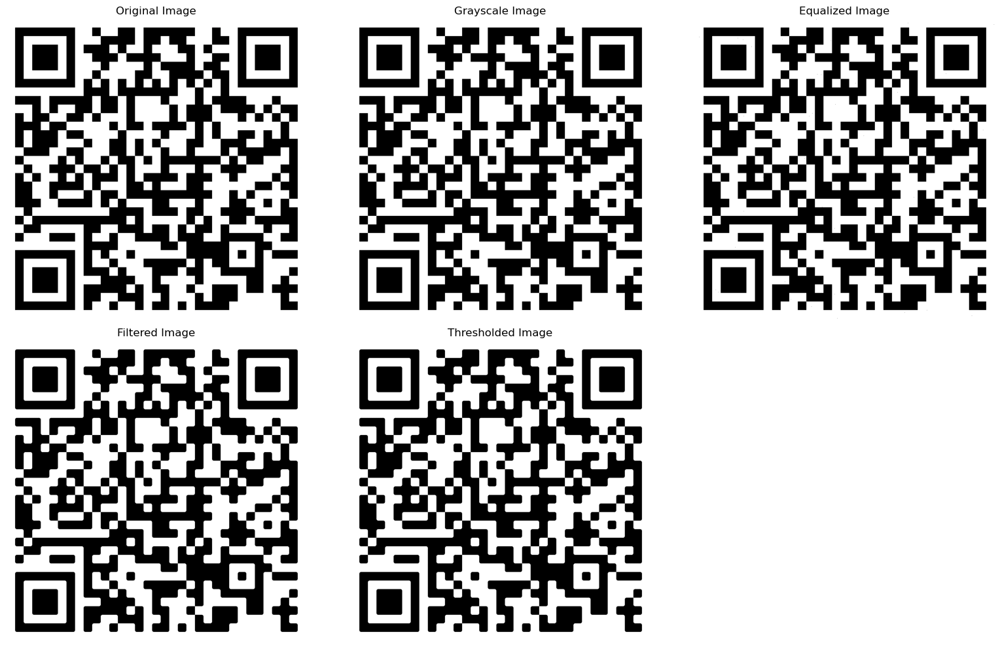

In [45]:
import cv2
import os
import matplotlib.pyplot as plt

# Directory containing QR code images
directory = "test cases"

# Function to load and preprocess images
def preprocess_images():
    for filename in os.listdir(directory):
        if filename.endswith(".png") or filename.endswith(".jpg"):
            # Load image
            img_path = os.path.join(directory, filename)
            img = cv2.imread(img_path)
            
            # Convert to grayscale
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
            # Histogram equalization
            eq_img = cv2.equalizeHist(gray_img)
            
            # Apply Median filter
            filtered_img = cv2.medianBlur(eq_img, 9)  # Adjust the kernel size as needed
            
            # Apply Binary Thresholding using Otsu's method
            _, thresh_img = cv2.threshold(filtered_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            # Plot original, grayscale, equalized, filtered, and thresholded images
            plt.figure(figsize=(10, 15))
            
             # Original image plot
            plt.subplot(1,2, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("Original Image")
            plt.axis('off')
            
            # Thresholded image plot
            plt.subplot(1,2, 2)
            plt.imshow(thresh_img, cmap='gray')
            plt.title("Thresholded Image")
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()
            
            # Further processing steps (contour detection, QR code extraction, etc.) can be added here

# Call the preprocessing function
preprocess_images()


## *TC-11*

In [10]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Directory containing QR code images
directory = "test cases"
output_directory = "processed_images"  # Directory to store processed images
test_cases = ["01-Getting-started.png", "02-Matsawar-3edel-ya3am.png","03-Leffy-bina-ya-donya.png", "04-Black-mirror.png",
              "10-Gone-With-The-Wind.png", "./Test Cases/11-weewooweewooweewoo.png","13-2el-noor-2ata3.png"]


# Function to deskew an image
def deskew_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = 255 - gray
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # Compute rotated bounding box
    coords = np.column_stack(np.where(thresh > 0))
    angle = cv2.minAreaRect(coords)[-1]

    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle

    print("Skew angle: ", angle)

    # Check if the angle is close to zero (not skewed much)
    if abs(angle) == 90:
        print("Image is not skewed, no rotation needed.")
        rotated = image  # Keep the original image
    elif abs(angle) == 0:
        #angle is 0:
        #rotate it by 90 degrees
        angle = 180
        (h, w) = image.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    else:
        # Rotate image to deskew
        (h, w) = image.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated


# Function to check and correct image inversion
def check_and_correct_inversion(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate the mean pixel intensity
    mean_intensity = np.mean(gray)
    
    # Check if the image is likely inverted based on mean intensity
    if 3 < mean_intensity < 127:  # Adjust threshold as needed
        print("Image is likely inverted. Inverting...")
        image = cv2.bitwise_not(image)
    
    return image


# Function to apply adaptive frequency domain filter
def adaptive_frequency_domain_filter(image, r, alpha):
    # Apply Discrete Cosine Transform (DCT)
    dct_image = cv2.dct(np.float32(image))

    # Calculate the median of the DCT coefficients
    median_dct = cv2.medianBlur(np.abs(dct_image), (9*r+1, 9*r+1))


    # Create a mask to identify peaks in the DCT coefficients
    mask = np.abs(dct_image) > alpha * median_dct

    # Apply the median filter to the DCT coefficients based on the mask
    filtered_dct = (1 - mask) * dct_image + mask * cv2.medianBlur(dct_image, 2*r+1)

    # Inverse DCT to get the filtered image
    filtered_image = cv2.idct(filtered_dct)

    # Normalize the filtered image
    filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)

    return np.uint8(filtered_image)


# Function to load and preprocess images
def preprocess_images():
    for filename in test_cases:
        if filename.endswith(".png") or filename.endswith(".jpg"):
            # Load image
            img_path = os.path.join(directory, filename)
            img = cv2.imread(img_path)
            
            # Check and correct image inversion
            img = check_and_correct_inversion(img)
            
            # Deskew image
            deskewed_img = deskew_image(img)
            
            # Convert to grayscale
            gray_img = cv2.cvtColor(deskewed_img, cv2.COLOR_BGR2GRAY)
            
            # Histogram equalization
            eq_img = cv2.equalizeHist(gray_img)
            
            # Apply Median filter
            filtered_img = cv2.medianBlur(eq_img, 9)  # Adjust the kernel size as needed
            
            # Apply adaptive frequency domain filter
            filtered_img = adaptive_frequency_domain_filter(filtered_img, r=1, alpha=6.5)
            
            # Apply Binary Thresholding using Otsu's method
            _, thresh_img = cv2.threshold(filtered_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            # Save processed image
            output_path = os.path.join(output_directory, filename)
            cv2.imwrite(output_path, thresh_img)
            
            # Plot original and thresholded images (optional)
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(thresh_img, cmap='gray')
            plt.title("Output Image")
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()


# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Call the preprocessing function
preprocess_images()

# After this, you can proceed with your morphological opening code if needed.


Skew angle:  -90.0
Image is not skewed, no rotation needed.


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\median_blur.dispatch.cpp:285: error: (-215:Assertion failed) (ksize % 2 == 1) && (_src0.dims() <= 2 ) in function 'cv::medianBlur'
